### Imports

In [1]:
import sys
sys.path.insert(0, "..")
from utils.dataset_utils import OriginalDataset, plot_image_array, plot_delta
from utils.huffman_encoding import (get_freq_dict,
                                    build_huffman_tree,
                                    generate_huffman_codes)
# Standard Downloads
import matplotlib.pyplot as plt
import numpy as np
import numpy as np
from sklearn.cluster import KMeans, DBSCAN
from collections import Counter
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
import seaborn as sns

(image found online, not from our dataset)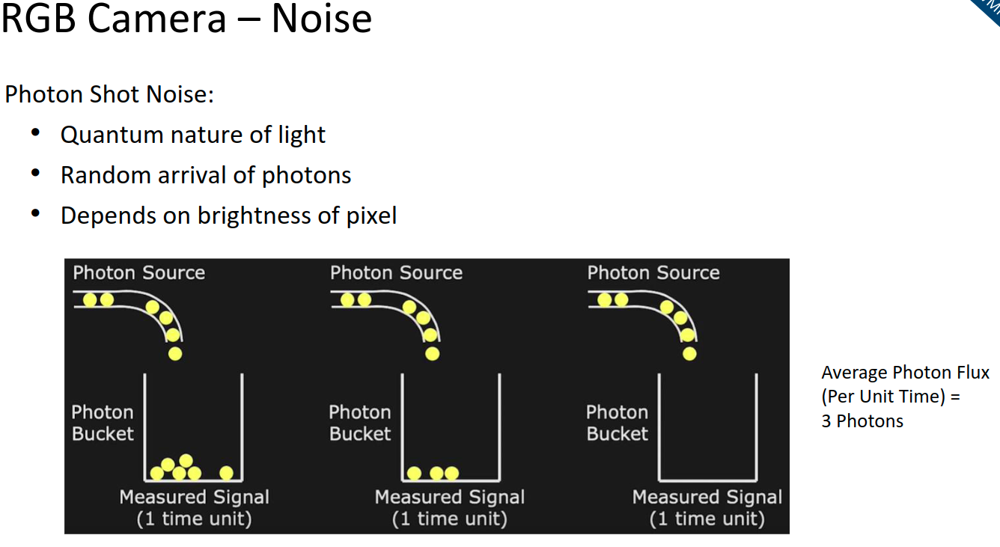

Screenshot taken from https://utn.instructure.com/courses/259/pages/study-material?module_item_id=4726
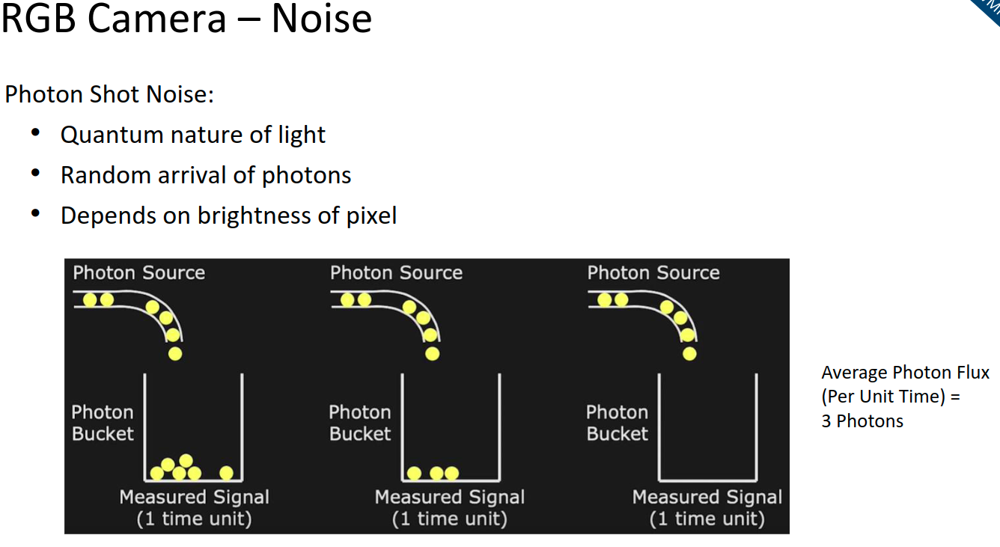

### Load Dataset

In [2]:
original_dataset = OriginalDataset('../datasets/droid_100_sample_pictures')
len_ = (original_dataset.__len__())
print(len_)

166


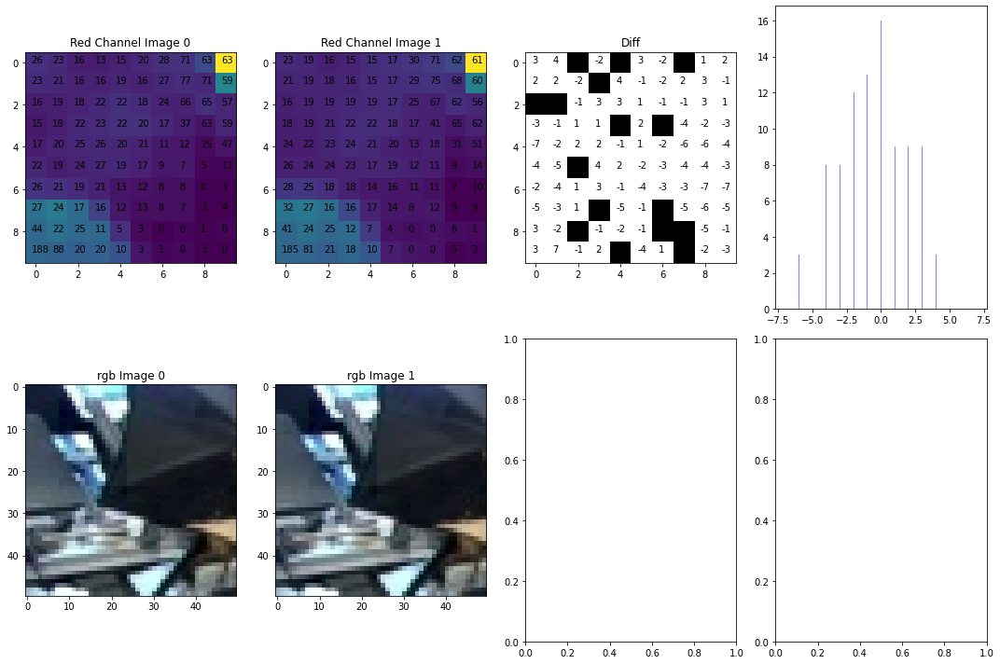

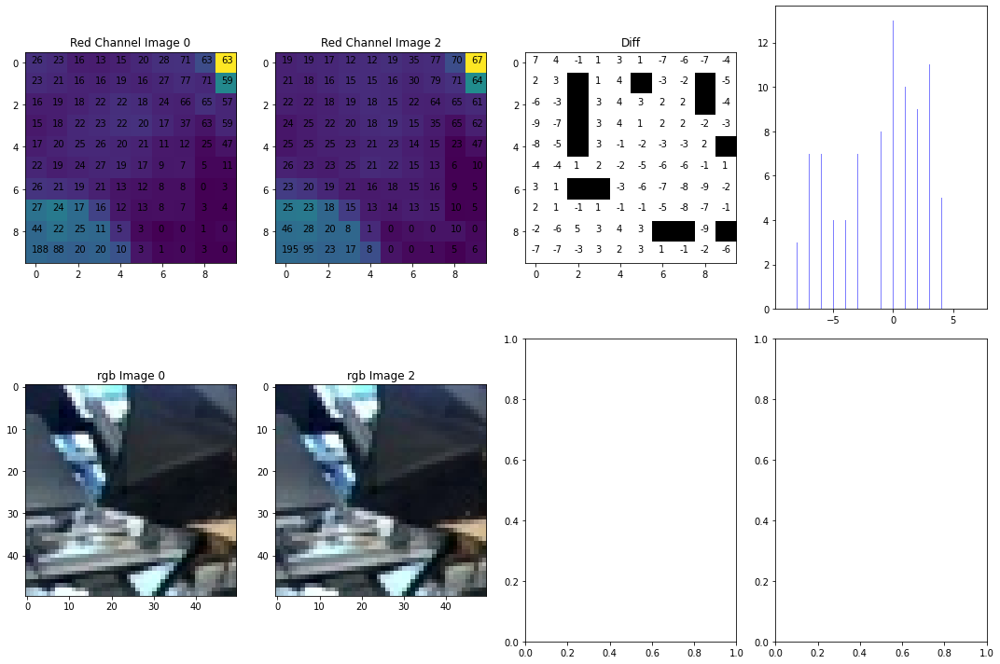

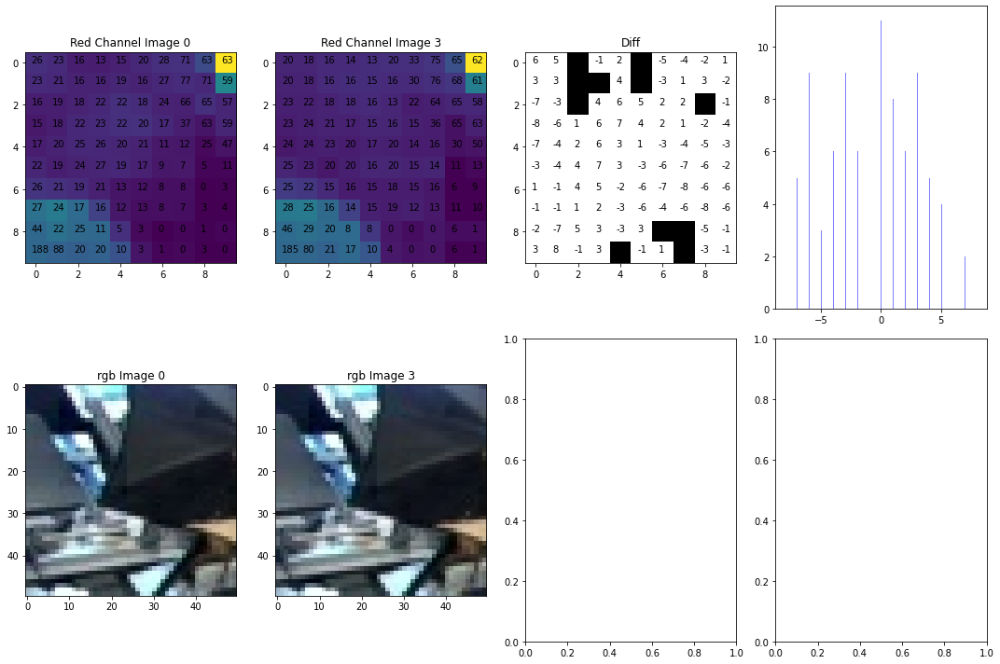

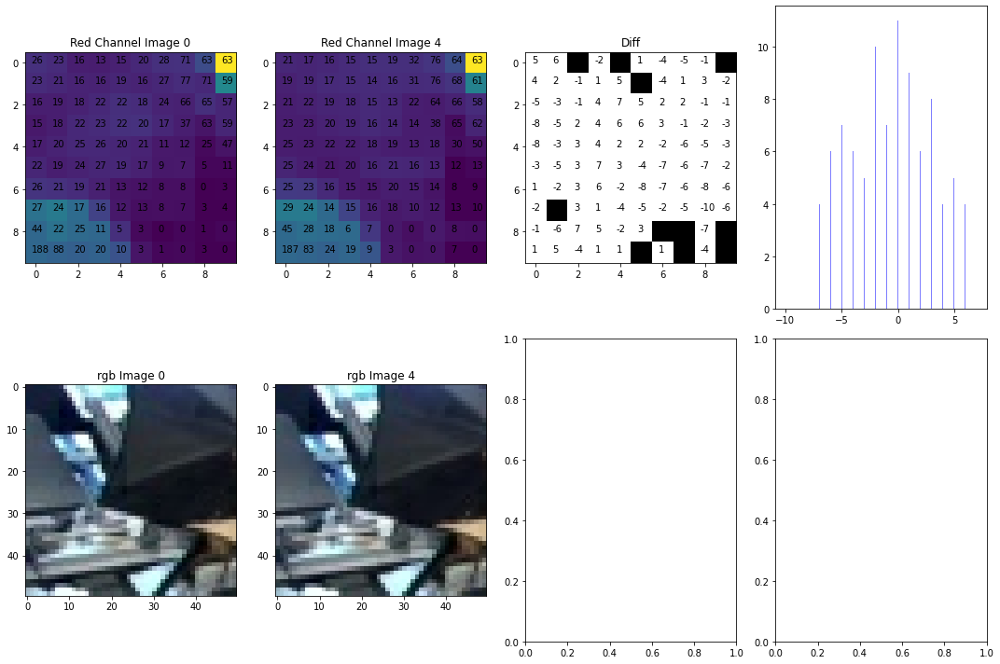

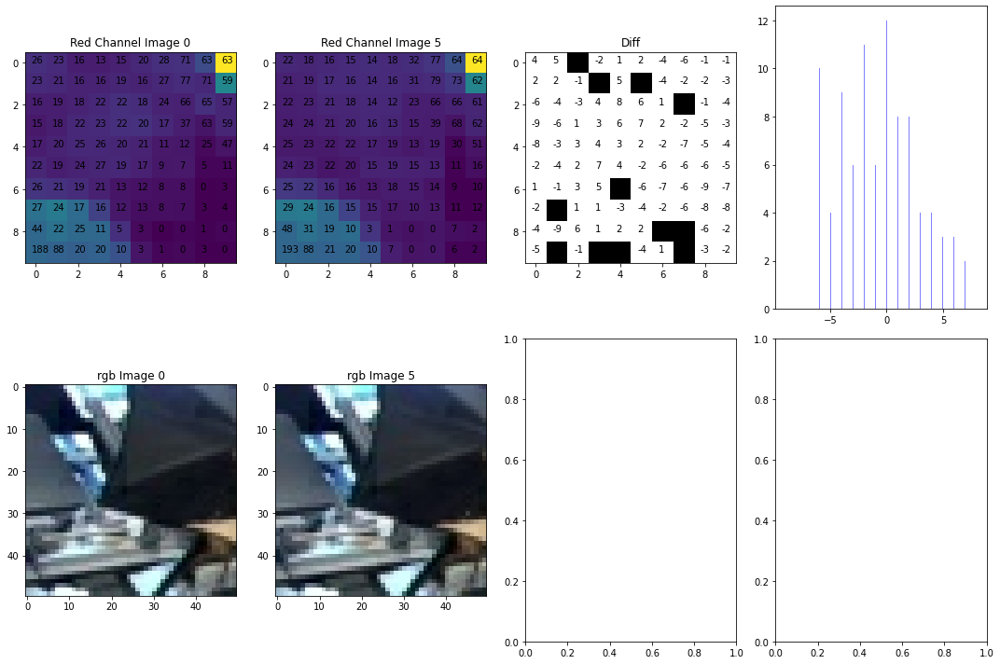

...

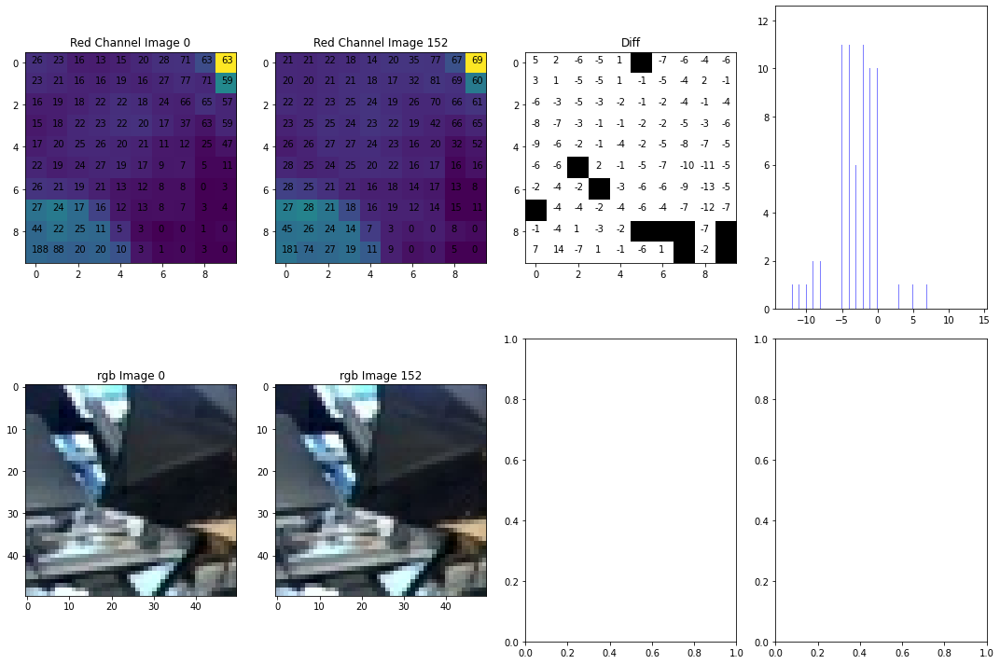

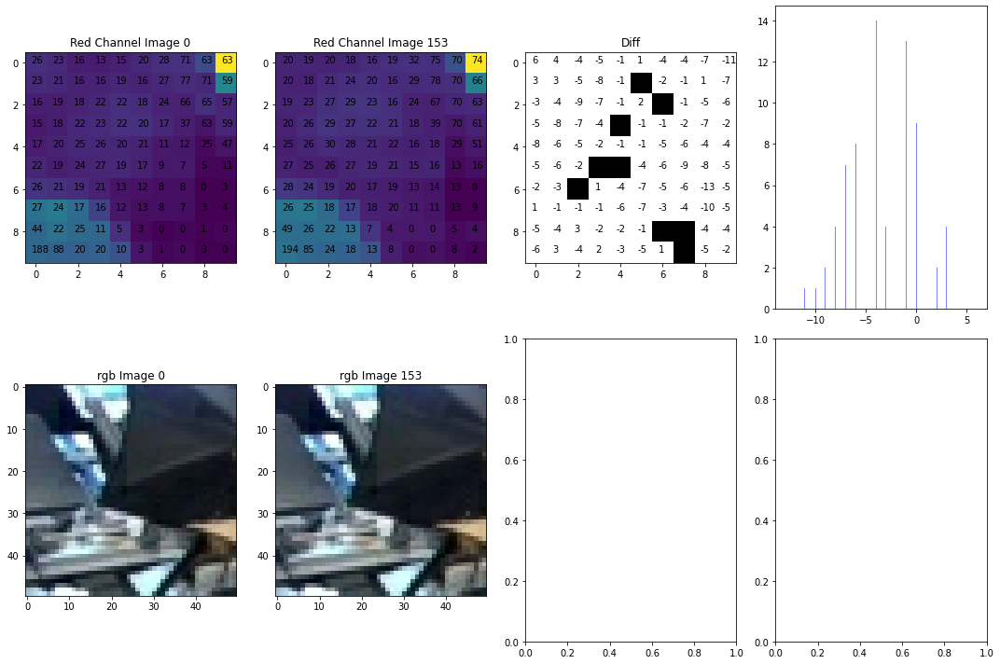

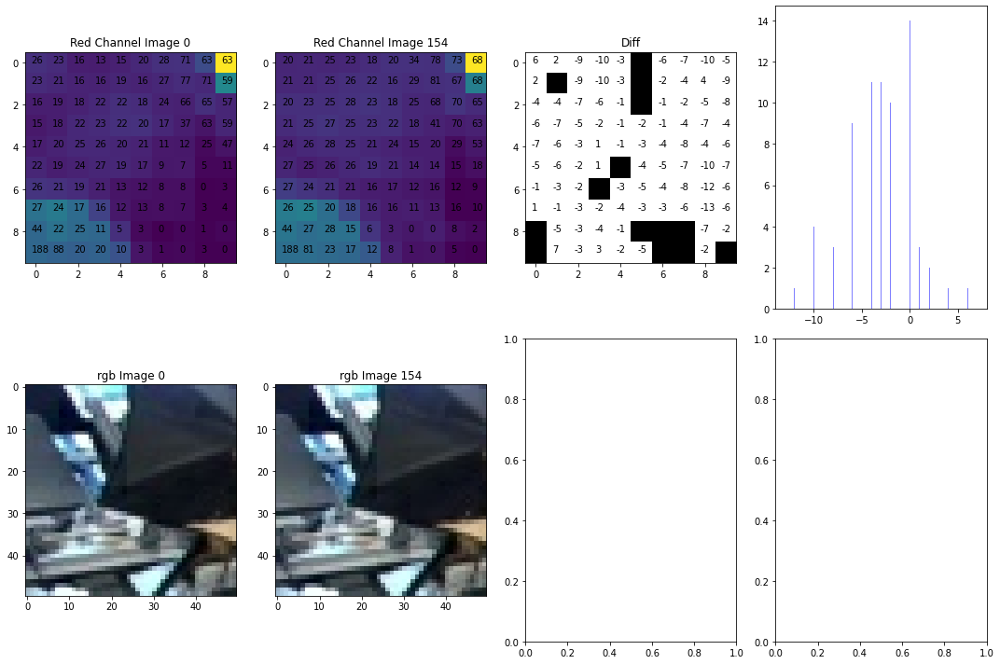

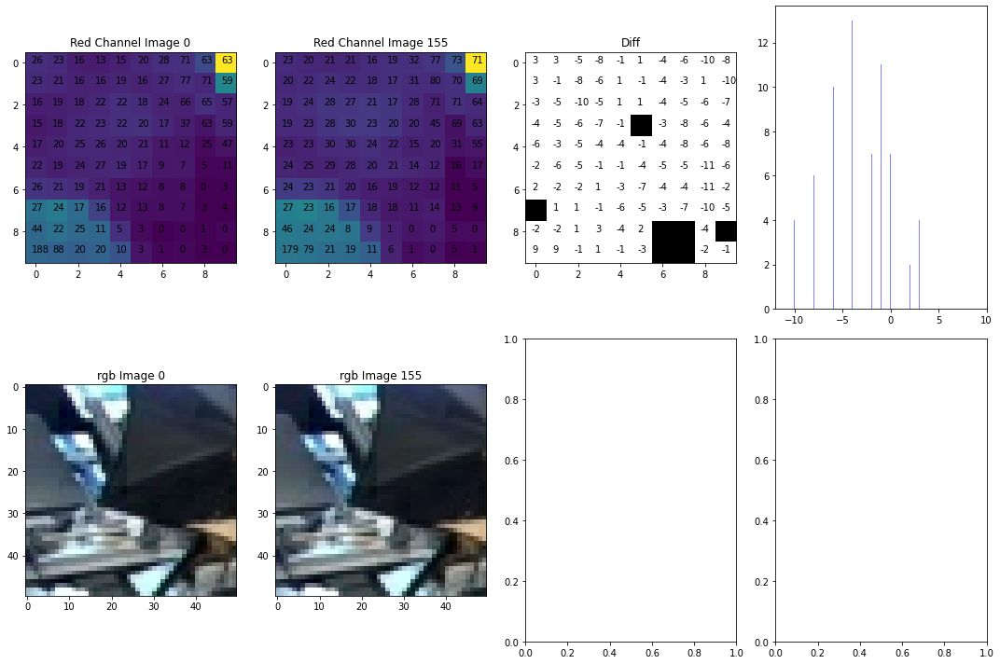

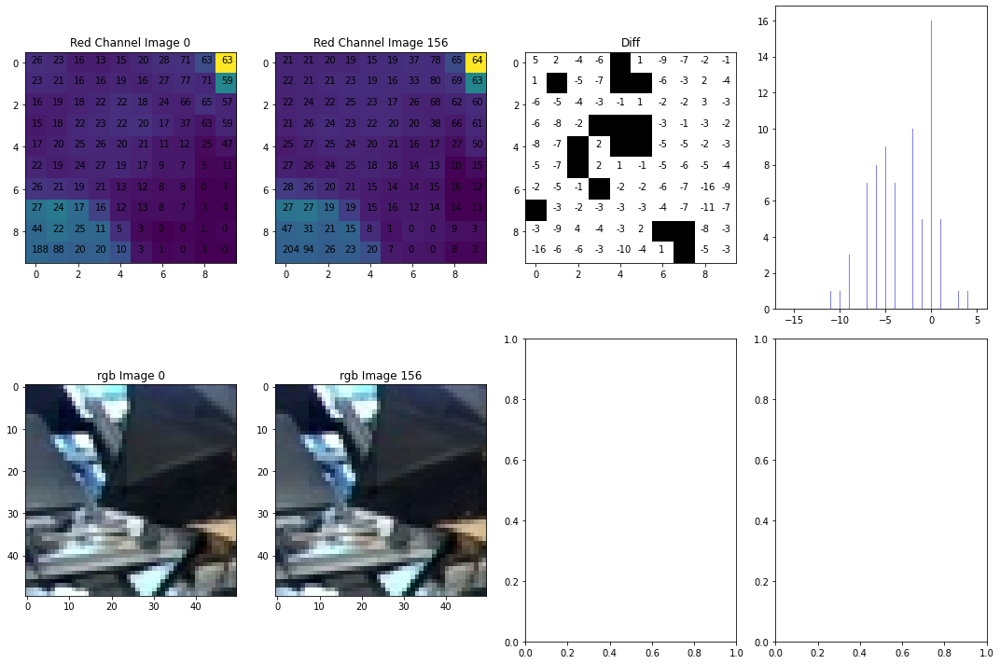

In [ ]:
num_imgs = 166
roi = [0, 10, 0, 10]
rgb_image1 = original_dataset[0]
image1 = rgb_image1[roi[0]:roi[1], roi[2]:roi[3], :][:, :, 0]
image1 = np.array(image1, dtype = np.int16)

diff_array = []
for i in range(num_imgs):
    if i== 0:
        continue
    rgb_image2 = original_dataset[i]
    image2 = rgb_image2[roi[0]:roi[1], roi[2]:roi[3], :][:, :, 0]
    image2 = np.array(image2, dtype = np.int16)
    diff_img = image1 -image2
    non_zero_diff_count, image3 = plot_delta(diff_img, color=False)
    image3*=255
    # Create a figure to hold the subplots
    fig, axes = plt.subplots(2, 4, figsize=(15, 10))
#     print(image1.shape)
    # Plot each image
    axes[0][0].imshow(image1)
    axes[0][0].set_title('Red Channel Image 0')
    # note that a larger region in image is shown so that it looks visually meaningful
    axes[1][0].imshow(rgb_image1[roi[0]:50, roi[2]:50, :])
    axes[1][0].set_title('rgb Image 0')
    for o in range(image3.shape[0]):
        for p in range(image3.shape[1]):
            axes[0][0].text(o-0.2,p, f"{image1[o][p]}")
    axes[0][1].imshow(image2)
    axes[1][1].imshow(rgb_image2[roi[0]:50, roi[2]:50, :])
    axes[1][1].set_title(f'rgb Image {i}')
    for m in range(image3.shape[0]):
        for n in range(image3.shape[1]):
            axes[0][1].text(m-0.2,n, f"{image2[m][n]}")
    axes[0][1].set_title(f'Red Channel Image {i}')
    
    axes[0][2].imshow(image3, cmap="gray")
    axes[0][2].set_title('Diff')
    for q in range(image3.shape[0]):
        for r in range(image3.shape[1]):
            axes[0][2].text(q-0.2,r, f"{diff_img[q][r]}")
    # plot for all channels
    axes[0][3].hist(diff_img.ravel(), bins=256, color='b', alpha=0.5)
    plt.tight_layout()
    plt.show()
    
    r = 0
    c = 4
    diff_array.append(diff_img.ravel())
diff_array = np.array(diff_array)
#     print("image2[r][c]: ", image2[r][c], "image2[r][c]: ", image1[r][c])
#     print(f"diff_image[r][c]: ", diff_img[r][c])
#     print(image3)

## diff array
this array contains the diff of the images with respect to the first image (currently only a small region in the image is considered)

In [ ]:
print(diff_array.shape)

In [ ]:
# ** the function below is burrowed from chatgpt for quick testing
# Function to find most common vector using K-Means
def most_common_vector_kmeans(data, n_clusters=10):
    # Initialize and fit K-Means model
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    labels = kmeans.fit_predict(data)
    
    # Count occurrences of each cluster label
    label_counts = Counter(labels)
    most_common_label = label_counts.most_common(1)[0][0]
    
    # Get the centroid of the most common cluster as the representative vector
    most_common_vector = kmeans.cluster_centers_[most_common_label]
    
    return most_common_vector, most_common_label, kmeans

In [ ]:
cluster_count = 3
most_common_vector, most_common_label, kmeans = most_common_vector_kmeans(diff_array, n_clusters=cluster_count)

In [ ]:
kmeans.labels_

In [ ]:
num_zeros =[]
for i in range(len(diff_array)):
    delta = diff_array[i]
    zero_count = np.sum(abs(delta) <= 4)  / len(delta)
    num_zeros.append(zero_count)
plt.plot(num_zeros)
plt.title("Num of zeros in delta - frame - first_frame")

In [ ]:
num_zeros =[]
cluster_centers = [np.array(list(map(int, list(cluster_center)))) for cluster_center in kmeans.cluster_centers_]
cluster_labels = kmeans.labels_
for i in range(len(diff_array)):
    cluster_center = cluster_centers[cluster_labels[i]]
    delta = cluster_center - diff_array[i]
    zero_count = np.sum(abs(delta) == 0) / len(delta)
    num_zeros.append(zero_count)
plt.plot(num_zeros)
plt.title(f"% of zeros in delta - KNN (k={cluster_count})")

In [ ]:
np.sum(kmeans.labels_)

In [ ]:
from sklearn.metrics import pairwise_distances

# Get the distances between each data point and its assigned cluster center
distances = pairwise_distances(diff_array, kmeans.cluster_centers_)
print("Distances between each vector and its cluster center:", distances)

In [ ]:
diff_array_images = [vec.reshape(image3.shape[0], image3.shape[1]) for vec in diff_array]

### cluster center 0

In [ ]:
plt.imshow(cluster_centers[0].reshape(image3.shape[0], image3.shape[1]) - diff_array_images[2])

In [ ]:
cluster_centers[0].reshape(image3.shape[0], image3.shape[1])  - diff_array_images[6]

### cluster center 1

In [ ]:
plt.imshow(cluster_centers[1].reshape(image3.shape[0], image3.shape[1]))

# K-means summary
1. cluster count = 2 works fine, imcreasing cluster count doesnt change much the num_zeros percentage

## fitting a gaussian distribution

In [ ]:
def sample_gaussian(mu, sigma, num_samples):
    """
    Generate samples from a Gaussian distribution with given mean and std dev.
    """
    samples = np.random.normal(mu, sigma, num_samples)
    samples = np.array(list(map(int, samples)))
    return samples

In [ ]:
# plot the variation of noise in one pixel in the image
data = sorted([d[0] for d in diff_array])
plt.hist(data)
# plt.plot(data)
# Fit a normal distribution to the data:
mu, std = norm.fit(data)
print("mu_sigma", (mu, std))
print(sample_gaussian(mu, std, 100))

In [ ]:
## fitting a gaussian distribution to the entire patch across all 166 timestamps (single mu and sigma)

In [ ]:
data = diff_array
sns.distplot(data)
plt.show()
# Fit a normal distribution to the data:
mu, std = norm.fit(data)
print(mu, std)
num_zeros =[]
for i in range(len(diff_array)):
    predicted_delta = sample_gaussian(mu, std, 100)
    delta = predicted_delta - diff_array[i]
    zero_count = np.sum(abs(delta) == 0)  / len(delta)
    num_zeros.append(zero_count)
plt.plot(num_zeros)
plt.title("% of zeros in delta - single Gaussian fitted on entire data")

In [ ]:
mu_sigma = []
for pixel_idx in range(len(diff_array[0])):
    data = sorted([d[pixel_idx] for d in diff_array])
#     sns.distplot(data)
#     plt.show()
    # Fit a normal distribution to the data:
    mu, std = norm.fit(data)
    mu_sigma.append([mu, std])

num_zeros =[]
for i in range(len(diff_array)):
    predicted_delta = np.zeros_like(diff_array[0])
    for j in range(len(diff_array[0])):
        predicted_delta[j] = sample_gaussian(*mu_sigma[j], 1)
    delta = predicted_delta - diff_array[i]
#     print(delta)
    zero_count = np.sum(abs(delta) == 0)  / len(delta)
    num_zeros.append(zero_count)
plt.plot(num_zeros)
plt.title("Num of zeros in delta - 100 Gaussians fitted( one for each pixel)")

# Gaussian summary
1. per pixel works better than whole patch fitted data

# Neural Network based noise Approximation(derived from Akash's notebook)

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau
from torch.utils.data import DataLoader, TensorDataset

# Generate or input your integer data here; let's assume values are in the range [0, 1000].
np.random.seed(0)
torch.manual_seed(0)

num_samples, vector_dim = diff_array.shape

# Create a random dataset of integer vectors with values in the range [0, 1000]
data = diff_array.astype(np.float32)

# Assign each vector a position; in this case, let's use a sequential index as the position.
positions = np.arange(num_samples).reshape(-1, 1).astype(np.float32)

# Min-Max normalization of vectors to range [0, 1]
data_min = data.min(axis=0)
data_max = data.max(axis=0)
# data_normalized = (data - data_min) / (data_max - data_min)

data_range = data_max - data_min
data_range[data_range == 0] = 1  # Set zero range to 1 to avoid division by zero
data_normalized = (data - data_min) / data_range

print("Any NaN in data:", np.isnan(data_normalized).any())
print("Any Inf in data:", np.isinf(data_normalized).any())

# Convert data to PyTorch tensors
positions_tensor = torch.tensor(positions)
data_tensor = torch.tensor(data_normalized)

# Create a DataLoader for easy batching
dataset = TensorDataset(positions_tensor, data_tensor)
dataloader = DataLoader(dataset, batch_size=5, shuffle=True)

# Define the neural network model
class TinyNN(nn.Module):
    def __init__(self, vector_dim):
        super(TinyNN, self).__init__()
        self.fc1 = nn.Linear(1, 128)
        self.fc2 = nn.Linear(128, 128)
        self.fc3 = nn.Linear(128, 128)
        self.fc4 = nn.Linear(128, 64)
        self.fc5 = nn.Linear(64, vector_dim)
        
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        x = self.fc4(x)
        x = self.fc5(x)
        return x

# Initialize the model, loss function, and optimizer
model = TinyNN(vector_dim=vector_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
# scheduler = StepLR(optimizer, step_size=50, gamma=0.1) 
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=5, verbose=True)
min_delta = 0.001
epochs_no_improve = 0 
patience = 20

# Training loop
best_loss = float('inf') 
epochs = 200
for epoch in range(epochs):
    model.train()
    epoch_loss = 0.0
    for positions_batch, vectors_batch in dataloader:
        # Forward pass
        predictions = model(positions_batch)
        # print(f"{predictions.shape = }")
        # print(f"{vectors_batch.shape = }")
        
        loss = criterion(predictions[0], vectors_batch[0])
        
        # print(f"{loss.item() = }")
        # assert False
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()

    # scheduler.step()
    # Print the average loss for each epoch
    avg_loss = epoch_loss / len(dataloader)
    scheduler.step(avg_loss)

    if avg_loss < best_loss - min_delta:
        best_loss = avg_loss
        epochs_no_improve = 0  # Reset the counter if loss improved
        print(f"Loss improved to {best_loss:.4f}, resetting patience counter.")
    else:
        epochs_no_improve += 1
        print(f"Epochs without improvement: {epochs_no_improve}/{patience}")

    # If no improvement for 'patience' epochs, stop training
    if epochs_no_improve >= patience:
        print(f"Early stopping triggered after {epoch+1} epochs.")
        break
    
    if avg_loss < best_loss:
        best_loss = avg_loss
    print(f"Epoch [{epoch+1}/{epochs}], Avg Loss: {avg_loss:.4f}")
    print(f"Epoch [{epoch+1}/{epochs}], Best Loss: {best_loss:.4f}")


In [ ]:
# Test the model by predicting a vector for a given position

def get_model_prediction(model, position: int):
    model = model.eval()
    test_position = torch.tensor([[position]], dtype=torch.float32)  # Example position
    with torch.no_grad():
        predicted_vector_normalized = model(test_position).numpy()

    # Reverse the normalization to get back to the original integer range
    predicted_vector = predicted_vector_normalized * (data_max - data_min) + data_min
    predicted_vector_int = np.floor(predicted_vector).astype(int)  # Convert to integer

#     print("Predicted vector at position 500 (original integer domain):", predicted_vector_int)
    return predicted_vector_int[0]


In [ ]:
num_zeros =[]
for i in range(len(diff_array)):
    predicted_delta = get_model_prediction(model, position=i)
#     print(predicted_delta, diff_array[i])
    delta = predicted_delta - diff_array[i]
#     print(delta)
    zero_count = np.sum(delta == 0)  / len(delta)
    num_zeros.append(zero_count)
plt.plot(num_zeros)
plt.title("% of zeros in delta - single NN fitted on entire data")

In [ ]:
# for a single pixel
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau
from torch.utils.data import DataLoader, TensorDataset
# Define the neural network model
class TinyNN(nn.Module):
    def __init__(self, vector_dim):
        super(TinyNN, self).__init__()
        self.fc1 = nn.Linear(1, 16)
        self.fc2 = nn.Linear(16, vector_dim)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x
    # Generate or input your integer data here; let's assume values are in the range [0, 1000].
    np.random.seed(0)
    torch.manual_seed(0)
        
def get_trained_model_on_pixel(pixel_pos: int, diff_array):
    data = np.array([[d[pixel_pos]] for d in diff_array])
    print(data.shape)
    # assert False
    num_samples, vector_dim = diff_array.shape[0], 1

    # Create a random dataset of integer vectors with values in the range [0, 1000]
    data = data.astype(np.float32)

    # Assign each vector a position; in this case, let's use a sequential index as the position.
    positions = np.arange(num_samples).reshape(-1, 1).astype(np.float32)

    # Min-Max normalization of vectors to range [0, 1]
    data_min = data.min(axis=0)
    data_max = data.max(axis=0)
    # data_normalized = (data - data_min) / (data_max - data_min)

    data_range = data_max - data_min
    # data_range[data_range == 0] = 1  # Set zero range to 1 to avoid division by zero
    data_normalized = (data - data_min) / data_range

    print("Any NaN in data:", np.isnan(data_normalized).any())
    print("Any Inf in data:", np.isinf(data_normalized).any())
    print(f"{positions.shape = }")
    print(f"{data_normalized.shape = }")
    # Convert data to PyTorch tensors
    positions_tensor = torch.tensor(positions)
    data_tensor = torch.tensor(data_normalized)
    print(f"{positions.shape = }")
    print(f"{data_tensor.shape = }")
    # Create a DataLoader for easy batching
    dataset = TensorDataset(positions_tensor, data_tensor)
    dataloader = DataLoader(dataset, batch_size=1, shuffle=True)



    # Initialize the model, loss function, and optimizer
    models = TinyNN(vector_dim=vector_dim)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    # scheduler = StepLR(optimizer, step_size=50, gamma=0.1) 
    scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=5, verbose=True)
    min_delta = 0.001
    epochs_no_improve = 0 
    patience = 20

    # Training loop
    best_loss = float('inf') 
    epochs = 200
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0.0
        for positions_batch, vectors_batch in dataloader:
            # Forward pass
            predictions = model(positions_batch)
            # print(f"{predictions.shape = }")
            # print(f"{vectors_batch.shape = }")

            loss = criterion(predictions[0], vectors_batch[0])

            # print(f"{loss.item() = }")
            # assert False
            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        # scheduler.step()
        # Print the average loss for each epoch
        avg_loss = epoch_loss / len(dataloader)
        scheduler.step(avg_loss)

        if avg_loss < best_loss - min_delta:
            best_loss = avg_loss
            epochs_no_improve = 0  # Reset the counter if loss improved
            print(f"Loss improved to {best_loss:.4f}, resetting patience counter.")
        else:
            epochs_no_improve += 1
            print(f"Epochs without improvement: {epochs_no_improve}/{patience}")

        # If no improvement for 'patience' epochs, stop training
        if epochs_no_improve >= patience:
            print(f"Early stopping triggered after {epoch+1} epochs.")
            break

        if avg_loss < best_loss:
            best_loss = avg_loss
        print(f"Epoch [{epoch+1}/{epochs}], Avg Loss: {avg_loss:.4f}")
        print(f"Epoch [{epoch+1}/{epochs}], Best Loss: {best_loss:.4f}")
    return model

models = [get_trained_model_on_pixel(i, diff_array) for i in range(len(diff_array[0]))]

In [ ]:

num_zeros =[]
for i in range(len(diff_array)):
    predicted_delta = [get_model_prediction(model, position=i) for i, model in enumerate(models)]
    print(f"{predicted_delta = }")
#     print(predicted_delta, diff_array[i])
    delta = predicted_delta - diff_array[i]
#     print(delta)
    zero_count = np.sum(delta == 0)  / len(delta)
    num_zeros.append(zero_count)
plt.plot(num_zeros)
plt.title("% of zeros in delta - single NN fitted on entire data")

In [ ]:
get_model_prediction(models[1], 2)

In [ ]:
f = [d[0] for d in diff_array]
print(f)

In [ ]:
print([model(torch.tensor([i], dtype=torch.float32)).item() for i in range(15)])